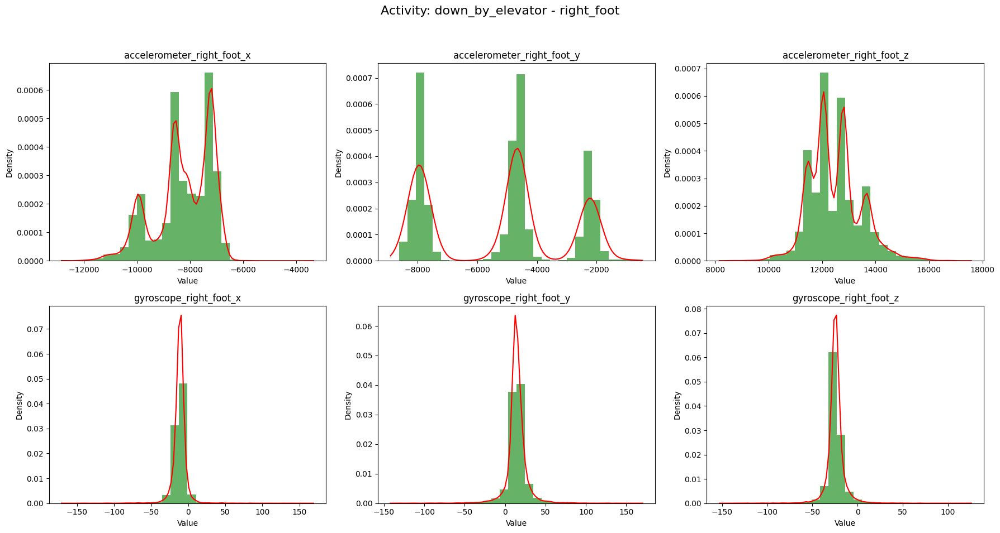

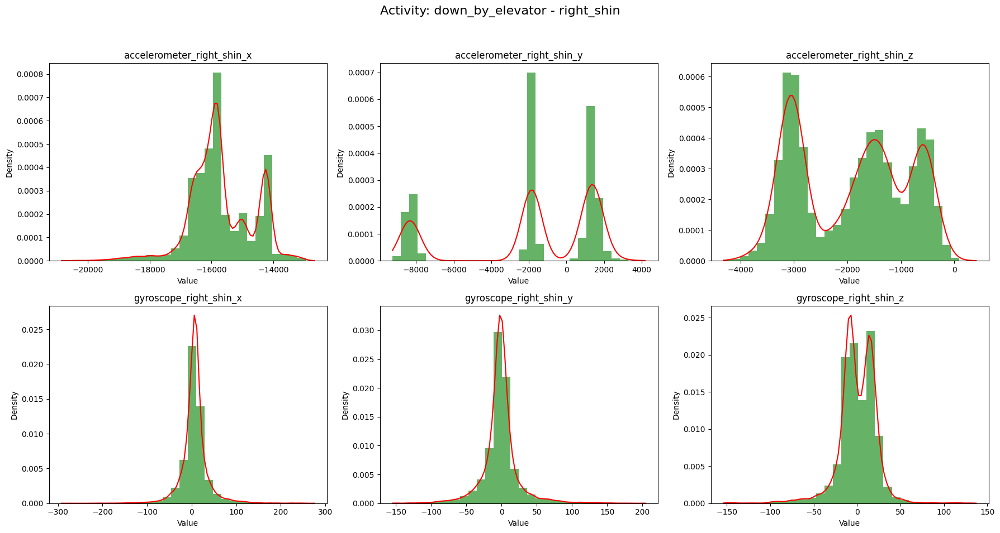

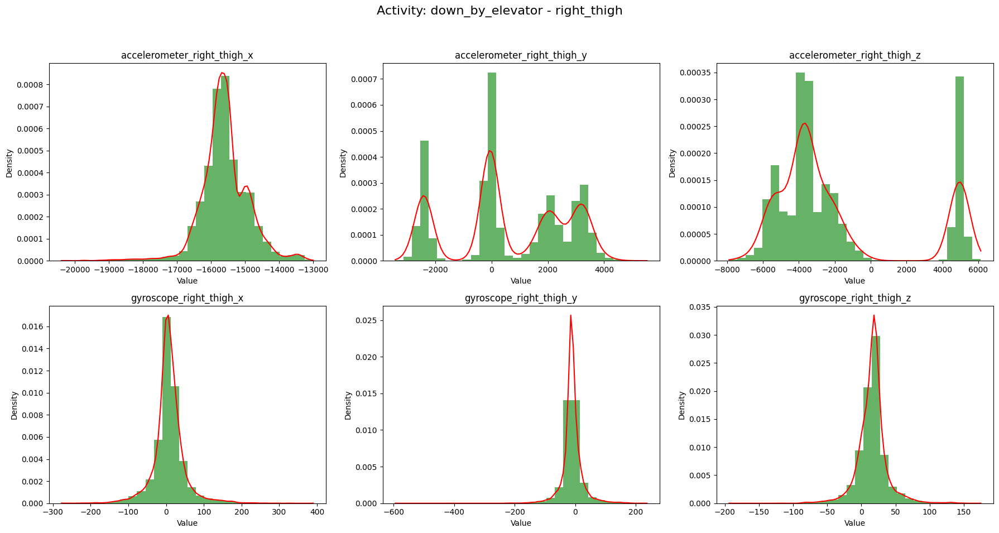

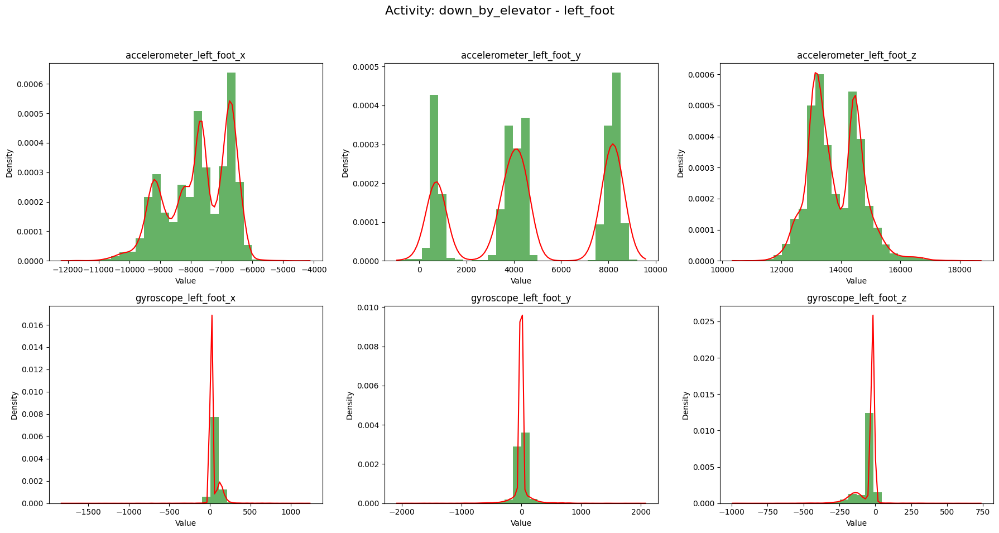

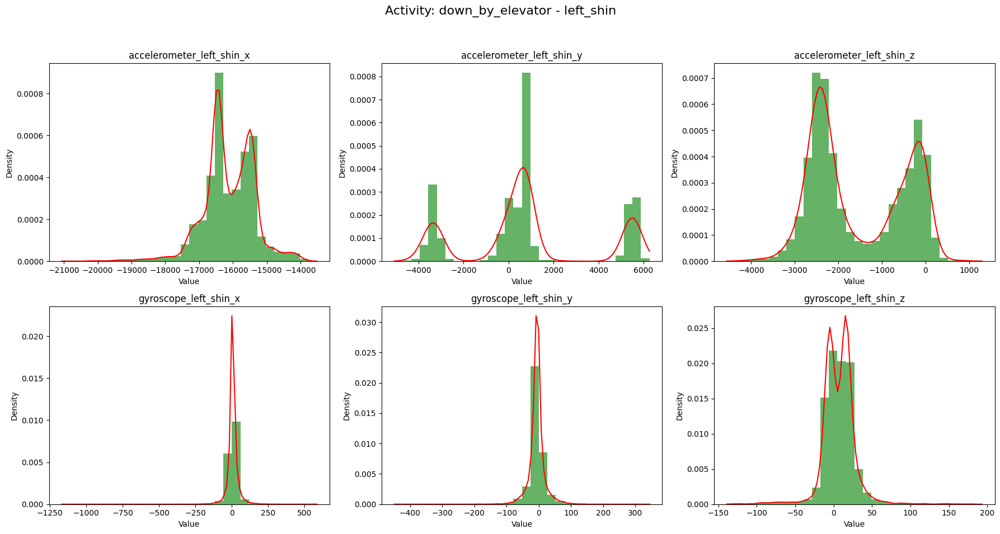

...

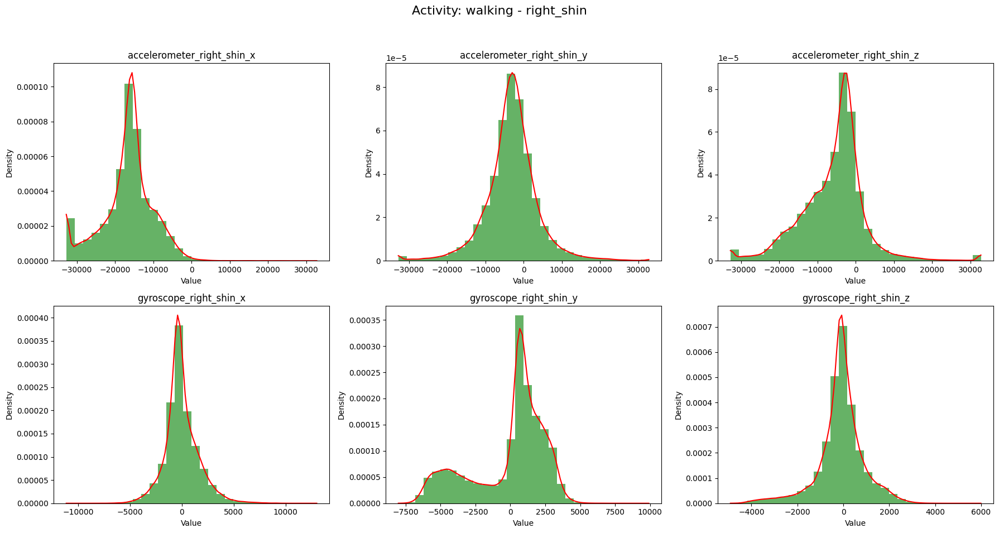

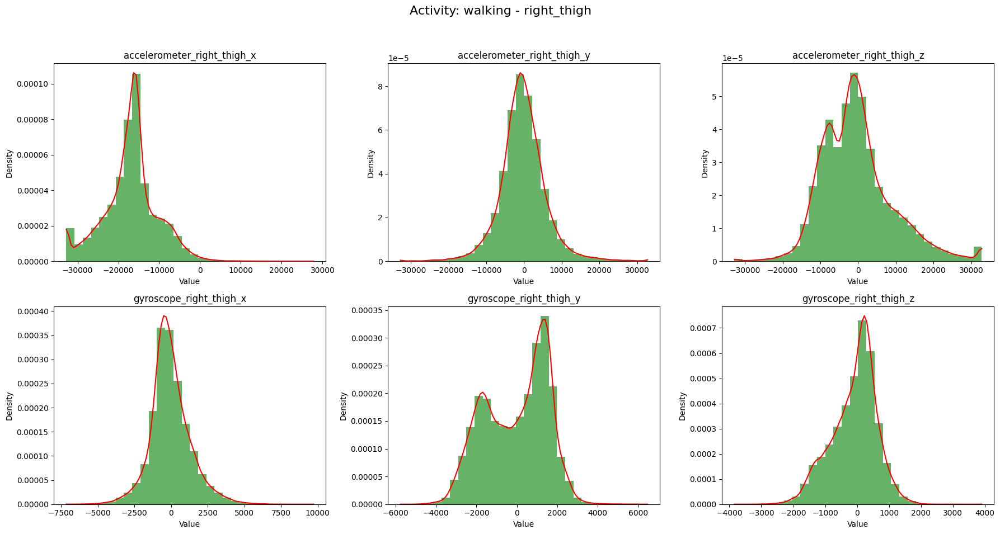

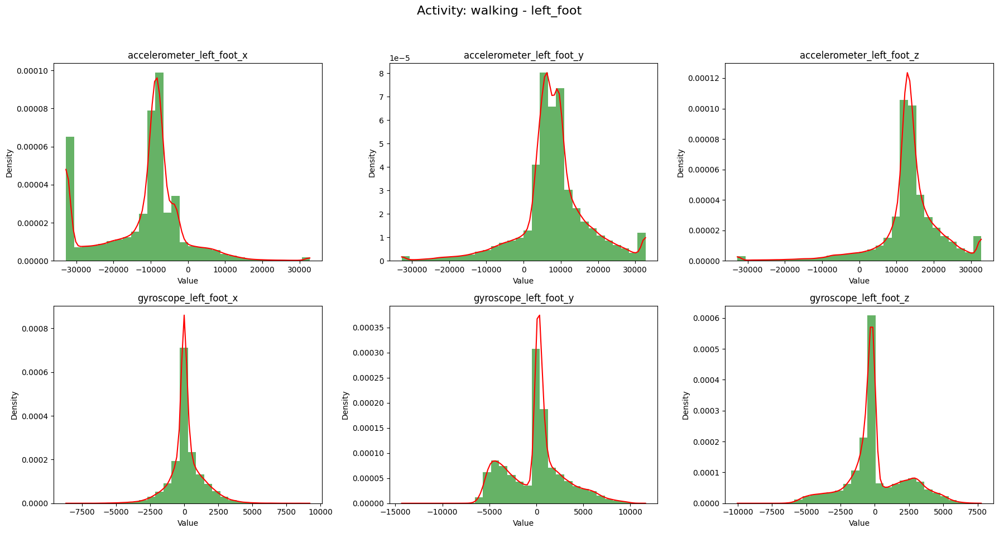

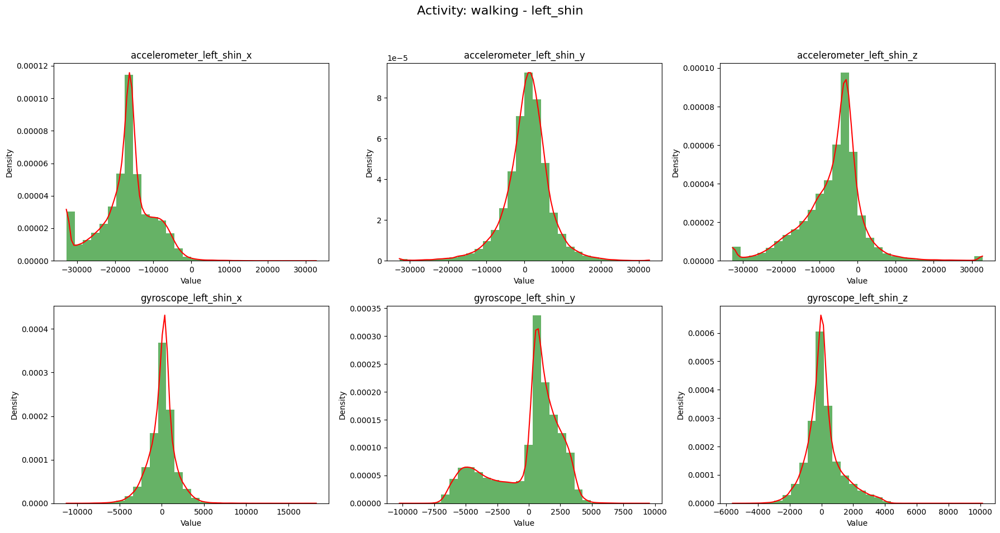

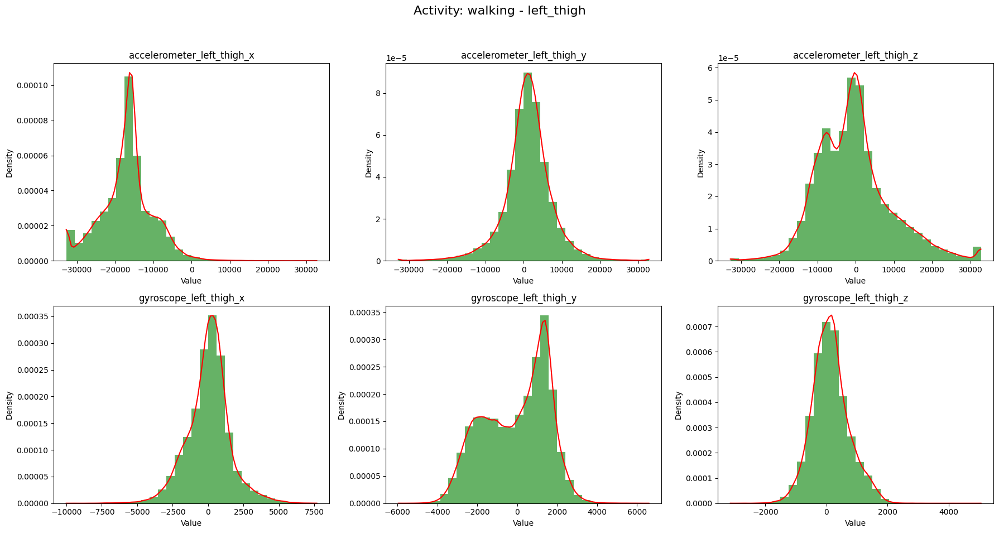

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import numpy as np

def plot_normal_distribution(df):
    sensor_groups = {
        'right_foot': ['accelerometer_right_foot_x', 'accelerometer_right_foot_y', 'accelerometer_right_foot_z', 'gyroscope_right_foot_x', 'gyroscope_right_foot_y', 'gyroscope_right_foot_z'],
        'right_shin': ['accelerometer_right_shin_x', 'accelerometer_right_shin_y', 'accelerometer_right_shin_z', 'gyroscope_right_shin_x', 'gyroscope_right_shin_y', 'gyroscope_right_shin_z'],
        'right_thigh': ['accelerometer_right_thigh_x', 'accelerometer_right_thigh_y', 'accelerometer_right_thigh_z', 'gyroscope_right_thigh_x', 'gyroscope_right_thigh_y', 'gyroscope_right_thigh_z'],
        'left_foot': ['accelerometer_left_foot_x', 'accelerometer_left_foot_y', 'accelerometer_left_foot_z', 'gyroscope_left_foot_x', 'gyroscope_left_foot_y', 'gyroscope_left_foot_z'],
        'left_shin': ['accelerometer_left_shin_x', 'accelerometer_left_shin_y', 'accelerometer_left_shin_z', 'gyroscope_left_shin_x', 'gyroscope_left_shin_y', 'gyroscope_left_shin_z'],
        'left_thigh': ['accelerometer_left_thigh_x', 'accelerometer_left_thigh_y', 'accelerometer_left_thigh_z', 'gyroscope_left_thigh_x', 'gyroscope_left_thigh_y', 'gyroscope_left_thigh_z']
    }
    
    grouped = df.groupby('activity')

    for activity, group in grouped:
        for sensor, columns in sensor_groups.items():
            fig, axs = plt.subplots(2, 3, figsize=(18, 10))
            fig.suptitle(f'Activity: {activity} - {sensor}', fontsize=16)

            for i, column in enumerate(columns):
                ax = axs[i//3, i%3]
                
                ax.hist(group[column], bins=30, alpha=0.6, color='g', density=True)
                
                kde = gaussian_kde(group[column].dropna())
                x = np.linspace(group[column].min(), group[column].max(), 100)
                ax.plot(x, kde(x), color='r')
                
                ax.set_title(column)
                ax.set_xlabel('Value')
                ax.set_ylabel('Density')

            plt.tight_layout(rect=[0, 0.03, 1, 0.95])
            plt.show()

df = pd.read_csv('./csv/database.csv')

plot_normal_distribution(df)
